# **P06** - Learning the topology of a Bayesian Network from a database of cases using the K2 algorithm

**ADVANCED STATISTICS**- UNIPD 2023

**| CARLO DIVARI**

In [1]:
#load packages
library('tidyverse')  |> suppressPackageStartupMessages()
library('bnlearn')    |> suppressPackageStartupMessages()
library('bnstruct')   |> suppressPackageStartupMessages()
library('Rgraphviz')  |> suppressPackageStartupMessages()
library('ggrepel')    |> suppressPackageStartupMessages()

***
## **Table of Contents**
1) [**PART 1**](#sec1)<a>
    - 1.1 [*DATASETS*](#sec1.1)<a>
        - 1.1.A [*CH93*](#sec1.1.A)<a>
        - 1.1.B [*ASIA*](#sec1.1.B)<a>
        - 1.1.C [*CHILD*](#sec1.1.C)<a>
    - 1.2 [*ALGORITHM*](#sec1.2)<a>
2) [**PART 2**](#sec2)<a>
    - 2.1 [*TESTS*](#sec2.1)<a>
        - 2.1.A [*TEST ON CH93*](#sec2.1.A)<a>
        - 2.1.B [*TEST ON ASIA DATASET*](#sec2.1.B)<a>
        - 2.1.C [*TEST ON CHILD DATASET*](#sec2.1.C)<a>         
    - 2.2 [*COMPARISON WITH TRUE GRAPHS*](#sec2.2)<a>
        - 2.2.A [*CH93*](#sec2.2.A)<a>
        - 2.2.B [*ASIA*](#sec2.2.B)<a>
        - 2.2.C [*CHILD*](#sec2.2.C)<a>
    - 2.3 [*K2 REVERSE or K2R*](#sec2.3)<a>
    - 2.4 [*K2 RANDOM*](#sec2.4)<a>
    
3) [**PART 3**](#sec3)<a>
    - 3.1 [*BNSTRUCT*](#sec3.1)<a>
        - 3.1.A [*Test on ASIA Dataset*](#sec3.1.A)<a>
        - 3.1.B [*Test on CHILD Dataset*](#sec3.1.B)<a>
    - 3.2 [*FINAL COMPARISONS*](#sec3.2)<a>

4) [**BIBLIOGRAPHY**](#sec4)<a>

<a id='sec1'></a>
# [**PART 1**](#sec1)<a>

# 1.1 [**DATASETS**](#sec1.1)

We will assess the performance of the K2 algorithm on three datasets of increasing complexity, each with a greater number of nodes.

# 1.1.A [**CH93**](#sec1.1.A)

Number of nodes: 3

In [2]:
CH93 <-  tibble(
x1   =   c(1,1,0,1,0,0,1,0,1,0),
x2   =   c(0,1,0,1,0,1,1,0,1,0),
x3   =   c(0,1,1,1,0,1,1,0,1,0))

CH93

x1,x2,x3
<dbl>,<dbl>,<dbl>
1,0,0
1,1,1
0,0,1
1,1,1
0,0,0
0,1,1
1,1,1
0,0,0
1,1,1


# 1.1.B [**ASIA**](#sec1.1.B)

Number of nodes: 8

In [3]:
Asia <- read_csv('ASIA.csv')

Asia <- Asia %>%
  mutate_all(~ ifelse(. == 'yes', TRUE, FALSE))

head(Asia)

Rows: 10000 Columns: 8
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (8): asia, tub, smoke, lung, bronc, either, xray, dysp

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


asia,tub,smoke,lung,bronc,either,xray,dysp
<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>
FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE
FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE
FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE
FALSE,FALSE,TRUE,FALSE,TRUE,FALSE,FALSE,TRUE
FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE


# 1.1.C [**CHILD**](#sec1.1.C)

Number of nodes: 20

In [4]:
Child <- read_csv('CHILD.csv')
head(Child)

Rows: 10000 Columns: 20
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (20): BirthAsphyxia, HypDistrib, HypoxiaInO2, CO2, ChestXray, Grunting, ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


BirthAsphyxia,HypDistrib,HypoxiaInO2,CO2,ChestXray,Grunting,LVHreport,LowerBodyO2,RUQO2,CO2Report,XrayReport,Disease,GruntingReport,Age,LVH,DuctFlow,CardiacMixing,LungParench,LungFlow,Sick
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
no,Equal,Moderate,Normal,Oligaemic,no,no,5-12,5-12,>=7.5,Grd_Glass,PAIVS,no,0-3_days,no,Lt_to_Rt,Complete,Normal,Low,yes
no,Equal,Severe,Normal,Asy/Patch,yes,no,12+,<5,<7.5,Asy/Patchy,TGA,no,0-3_days,no,None,Transp.,Abnormal,Low,yes
no,Equal,Severe,Normal,Normal,no,yes,12+,5-12,<7.5,Normal,TGA,no,0-3_days,yes,None,Transp.,Normal,High,yes
no,Equal,Moderate,Normal,Asy/Patch,yes,no,5-12,5-12,>=7.5,Asy/Patchy,Lung,yes,0-3_days,no,None,Mild,Abnormal,Normal,yes
no,Equal,Moderate,Normal,Normal,no,no,5-12,5-12,<7.5,Normal,Fallot,no,4-10_days,no,Lt_to_Rt,Complete,Normal,Low,no
no,Equal,Moderate,Normal,Oligaemic,no,no,5-12,<5,<7.5,Oligaemic,Fallot,yes,4-10_days,no,Lt_to_Rt,Mild,Normal,Low,no


# 1.2 [**ALGORITHM**](#sec1.2)

The K2 algorithm's objective is to heuristically learn the most probable belief-network structure, or topology, from a database of cases. 

To transition from one potential topology to another, it employs the function f (i , $\pi_{i}$), represented by the formula:

$$f(i,\pi_{i}) = \prod_{j=1}^{q_{i}}(\frac{(r_{i}-1)!}{\N_{ij}+r_{i}-1})\prod_{k=1}^{r_{i}}\alpha_{ijk}!$$

where:

•$\pi_{i}$: Set of parents of node $x_{i}$

•$q_{i}$: Number of possible instantiations of the parents of $x_{i}$ in database $D$. That is, if $p_{1}, \ldots, p_{s}$ are the parents of $x_{i}$, then $q_{i}$ is the number of possible values of attributes $p_{1}$ through $p_{s}$.

•$r_{i}$: Number of possible values of the attribute $x_{i}$.


•$\varphi_{i}$: List of all possible instantiations of the parents of $x_{i}$ in database $D$. That is, if $p_{1}, \ldots, p_{s}$ are the parents of $x_{i}$, then $\varphi_{i}$ is the Cartesian product $\{v_{1}^{p_{1}}, \ldots, v_{r}^{p_{s}}\} \times \ldots \times \{v_{1}^{p_{s}}, \ldots, v_{r}^{p_{s}}\}$ of all the possible values of attributes $p_{1}$ through $p_{s}$.


•$V_{i}$: List of all possible values of the attribute $x_{i}$.


•$\alpha_{ijk}$: Number of cases (i.e., instances) in $D$ in which the attribute $x_{i}$ is instantiated with its $k$-th value, and the parents of $x_{i}$ in $\pi_{i}$ are instantiated with the $j$-th instantiation in $\varphi_{i}$.


•$N_{ij}$: $\sum_{k=1}^{r_{i}} \alpha_{ijk}$. That is, the number of instances in the database in which the parents of $x_{i}$ in $\pi_{i}$ are instantiated with the $j$-th instantiation in $\varphi_{i}$. \\


•$\alpha_{ij}$ is the number of cases in the database $D$ in which $x_{i} = j$ and $x_{i}$'s parents are defined by $\pi_{i}$.


In essence, f (i , $\pi_{i}$) captures the probability of the database D given that $x_{i}$ has parents defined by $\pi_{i}$.

The simplest version of the K2 algorithm is a greedy search algorithm that begins with a network with no arcs and adds arcs one at a time until the network's score cannot be improved.


In [5]:
options(dplyr.summarise.inform = FALSE)

#Probability
f     <- function(dataset,node,parents){
  
    r <- nrow(unique(dataset[node]))
    
    #Table of the alpha values
    table_alpha  <-  dataset[c(node,parents)] %>% group_by(dataset[c(node,parents)] ) %>% summarize(alpha = n()) %>% ungroup()
    #Table of the N values
    table_counts <-  table_alpha %>% group_by(table_alpha[parents]) %>% summarize(N = sum(alpha)) %>% ungroup()
    
    #Result of the second productory
    alpha_term   <-  prod(factorial(table_alpha$alpha))
    
    #Result of the first productory
    Initial_term <-  prod(sapply(table_counts$N, function(N) (factorial(r - 1) / factorial(N + r - 1))))

    Probability  <-  Initial_term*alpha_term

    return(Probability)

    
}

In [6]:
#The K2 algorithm needs in input the maximum number of parents that we want to consider
#in the search of the best network
k2_algorithm <- function(upper.limit.parents,dataset,f){
    
    #We start the timer
    Start   <- Sys.time()
    
    #We take the names of the dataset as nodes
    nodes   <- names(dataset)
    n       <- length(nodes)
    
    network <- empty.graph(nodes=nodes)
    
   
    # We start from i=2 because the first node doesn't have previous nodes so
    # it doesn't have parents
    for(i in 2:n){
        cat('giro',i,'\n')
        
        node    <- nodes[i]
        cat('nodo',node,'\n')
        
        Pred    <- nodes[1:(i-1)]
        cat('nodi precedenti: ',Pred,'\n')
        
        parents <- c()
        cat('i parenti di ',node,' sono ', parents,'\n')
        
        P_old   <- f(dataset,node,parents)
        cat('P_old = ',P_old,'\n')
        
        OKToProceed <- TRUE

        while( OKToProceed & length(parents) < upper.limit.parents ){
            
            possible.parents <- setdiff(Pred,parents)
            
            z     <- possible.parents[which.max(sapply(possible.parents, function(J) f(dataset, node, c(parents, J))))]
            cat('Best possible candidate is ',z,'\n')        
            
            P_new <- f(dataset,node,c(parents,z))
            cat('P_new = ',P_new,'\n')

            if (P_new > P_old) {
                
                parents <- c(parents, z)
                cat('parents: ',parents,'\n')
                
                P_old   <- P_new
                cat('P_old = P_new = ',P_old,'\n')
                
                #Draw the arc from the parent to the node
                network <- set.arc(network, from=z, to=node)
            } else {
                
                OKToProceed <- FALSE
                
            }
        }
    }
    #Score of the network
    Evaluation     <- score(network, dataset |> mutate_all(as_factor) |> as.data.frame())
    
    #Stop the timer
    Stop           <- Sys.time()

    Execution_time <- Stop - Start
    cat("Elapsed time:", Execution_time, "seconds\n")

    return(list('Network'=network,'Evaluation'=Evaluation))
}

# [**PART 2**](#sec2)

# 2.1 [**TESTS**](#sec2.1)

2.1.A [**TEST ON CH93**](#sec2.1.A)

In [7]:
CH93_net<-k2_algorithm(upper.limit.parents=2,dataset=CH93,f=f)

giro 2 
nodo x2 
nodi precedenti:  x1 
i parenti di  x2  sono  
P_old =  0.0003607504 
Best possible candidate is  x1 
P_new =  0.001111111 
parents:  x1 
P_old = P_new =  0.001111111 
Best possible candidate is   
P_new =  0.001111111 
giro 3 
nodo x3 
nodi precedenti:  x1 x2 
i parenti di  x3  sono  
P_old =  0.0004329004 
Best possible candidate is  x2 
P_new =  0.005555556 
parents:  x2 
P_old = P_new =  0.005555556 
Best possible candidate is  x1 
P_new =  0.0025 
Elapsed time: 0.3058629 seconds


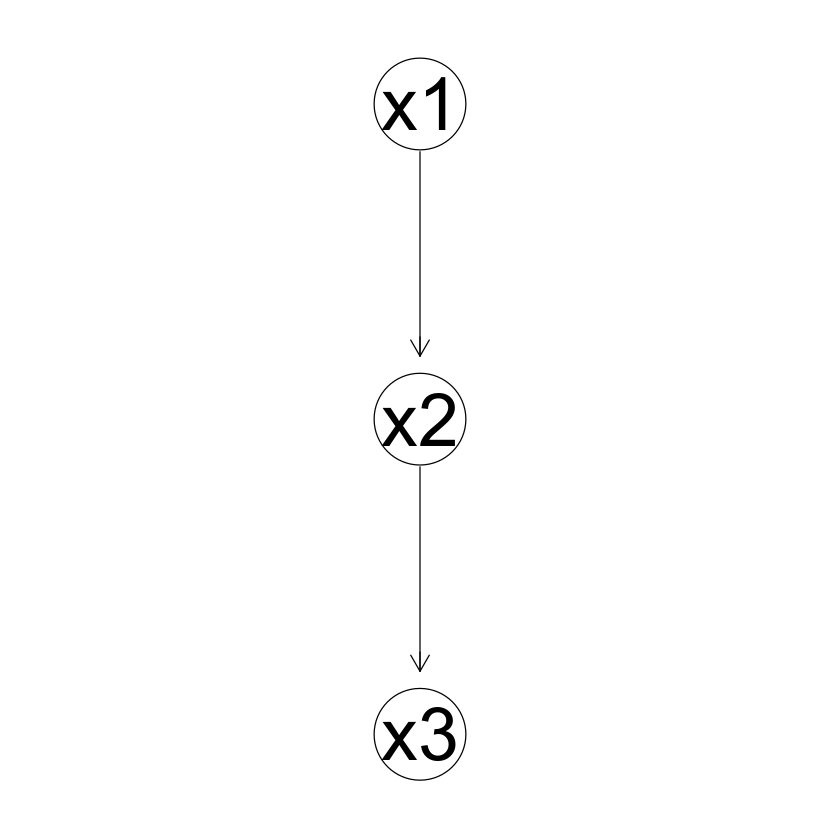

In [8]:
#Graph of the network
graphviz.plot(CH93_net$Network)

It coincides with the result obtained by the K2 algorithm in the original paper.[[3]](#ref3)

2.1.B [**TEST ON ASIA DATASET**](#sec2.1.B)

In [9]:
Asia_2 <- Asia %>%
  mutate_all(function(x) as.numeric(factor(x)))

head(Asia_2)

asia,tub,smoke,lung,bronc,either,xray,dysp
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,1,1,1,1,1,2
1,1,2,1,1,1,1,1
1,1,1,1,1,1,1,1
1,1,2,1,1,1,1,1
1,1,2,1,2,1,1,2
1,1,2,1,1,1,1,1


In [18]:
Asia_net<-k2_algorithm(upper.limit.parents=2,dataset=Asia,f=f)

giro 2 
nodo tub 
nodi precedenti:  asia 
i parenti di  tub  sono  
P_old =  NaN 
Best possible candidate is   
P_new =  NaN 


ERROR: Error in if (P_new > P_old) {: missing value where TRUE/FALSE needed


# ERROR

We encounter an error when a value becomes excessively large, specifically with $N_j$ reaching 1000!, which R interprets as infinite. To address this issue, we can apply the logarithm to the function f.

In [10]:
log.f <- function(dataset,node,parents){
  
    r <-  nrow(unique(dataset[node]))
    
    #Creates a table with the alpha values
    table_alpha  <- dataset[c(node,parents)] %>% 
      group_by(dataset[c(node,parents)] )  %>%
      summarize(alpha = n()) %>% 
      ungroup()
    
    #Creates a table with the N values
    table_counts  <- table_alpha %>%
      group_by(table_alpha[parents]) %>%
      summarize(N = sum(alpha)) %>%
      ungroup()
    
    #Compute the log of the alpha factorials as sums of the logs of the single terms
    alpha_log_terms <- sapply(1:nrow(table_alpha),
    function(x) sum(log(1:table_alpha$alpha[x]))
      )
    
    #Second term of the productory
    Alpha_value  <- sum(alpha_log_terms)
    
    #Compute the log of the N factorials as sums of the logs of the single terms
    Initial_den_log_terms <- sapply(1:nrow(table_counts),
     function(x) sum(log(1:(table_counts$N[x]+r-1)))
     )
    
    #Denominator of the first term of the productory
    Initial_den_value <- sum(Initial_den_log_terms)
    
    #Numerator of the first term of the productory
    R_log_term        <- sum(log(1:(r-1)))*length(table_counts$N)
    
    #Log of the probability
    log_Probability   <- Alpha_value+R_log_term-Initial_den_value

    return(log_Probability)

    
}

**RETAKE TEST ON ASIA DATASET**

In [11]:
Asia_net<-k2_algorithm(upper.limit.parents=2,dataset=Asia,f=log.f)

giro 2 
nodo tub 
nodi precedenti:  asia 
i parenti di  tub  sono  
P_old =  -575.1688 
Best possible candidate is  asia 
P_new =  -575.264 
giro 3 
nodo smoke 
nodi precedenti:  asia tub 
i parenti di  smoke  sono  
P_old =  -6935.428 
Best possible candidate is  asia 
P_new =  -6937.323 
giro 4 
nodo lung 
nodi precedenti:  asia tub smoke 
i parenti di  lung  sono  
P_old =  -2094.995 
Best possible candidate is  smoke 
P_new =  -1889.711 
parents:  smoke 
P_old = P_new =  -1889.711 
Best possible candidate is  asia 
P_new =  -1895.197 
giro 5 
nodo bronc 
nodi precedenti:  asia tub smoke lung 
i parenti di  bronc  sono  
P_old =  -6878.287 
Best possible candidate is  smoke 
P_new =  -6420.057 
parents:  smoke 
P_old = P_new =  -6420.057 
Best possible candidate is  tub 
P_new =  -6422.694 
giro 6 
nodo either 
nodi precedenti:  asia tub smoke lung bronc 
i parenti di  either  sono  
P_old =  -2361.931 
Best possible candidate is  lung 
P_new =  -548.4825 
parents:  lung 
P_old = P_

# 2.1.C [**TEST ON CHILD DATASET**](#sec2.1.C)

In [12]:
Child_net<-k2_algorithm(upper.limit.parents=2,dataset=Child,f=log.f)

giro 2 
nodo HypDistrib 
nodi precedenti:  BirthAsphyxia 
i parenti di  HypDistrib  sono  
P_old =  -3209.341 
Best possible candidate is  BirthAsphyxia 
P_new =  -3195.052 
parents:  BirthAsphyxia 
P_old = P_new =  -3195.052 
Best possible candidate is   
P_new =  -3195.052 
giro 3 
nodo HypoxiaInO2 
nodi precedenti:  BirthAsphyxia HypDistrib 
i parenti di  HypoxiaInO2  sono  
P_old =  -9492.672 
Best possible candidate is  HypDistrib 
P_new =  -9415.965 
parents:  HypDistrib 
P_old = P_new =  -9415.965 
Best possible candidate is  BirthAsphyxia 
P_new =  -9411.368 
parents:  HypDistrib BirthAsphyxia 
P_old = P_new =  -9411.368 
giro 4 
nodo CO2 
nodi precedenti:  BirthAsphyxia HypDistrib HypoxiaInO2 
i parenti di  CO2  sono  
P_old =  -7695.154 
Best possible candidate is  HypDistrib 
P_new =  -7692.229 
parents:  HypDistrib 
P_old = P_new =  -7692.229 
Best possible candidate is  BirthAsphyxia 
P_new =  -7700.16 
giro 5 
nodo ChestXray 
nodi precedenti:  BirthAsphyxia HypDistrib Hyp

# 2.2 [**COMPARISON WITH TRUE GRAPHS**](#sec2.2)

2.2.A [**CH93**](#sec2.2.A)

In [13]:
#Structure of the true CH93 network
True_CH93_network = model2network("[x2|x1][x3|x2][x1]")

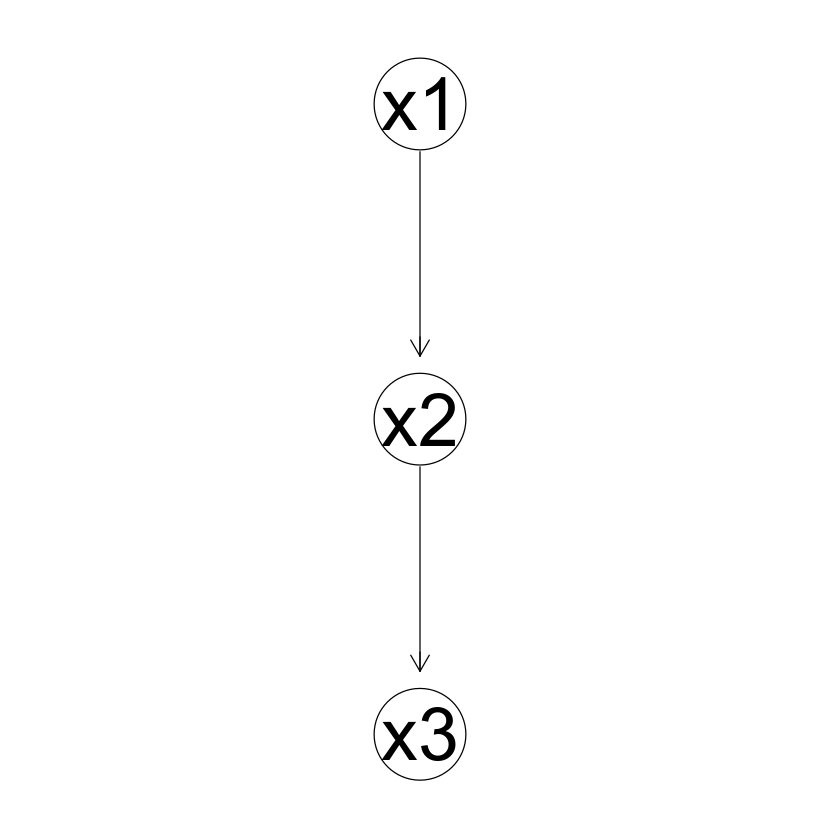

In [14]:
#Graphical comparison between the two networks
graphviz.compare(CH93_net$Network,True_CH93_network)

2.2.B [**ASIA**](#sec2.2.B)

In [15]:
#Structure of the true Asia network
True_asia_network = model2network("[asia][smoke][tub|asia][lung|smoke][bronc|smoke][dysp|bronc:either][either|tub:lung][xray|either]")

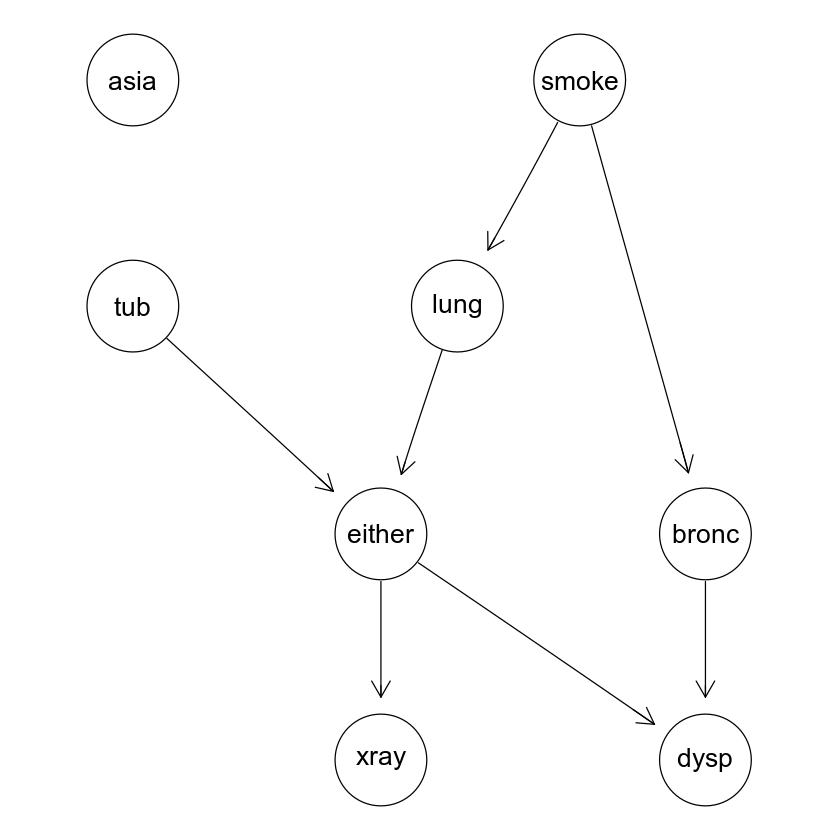

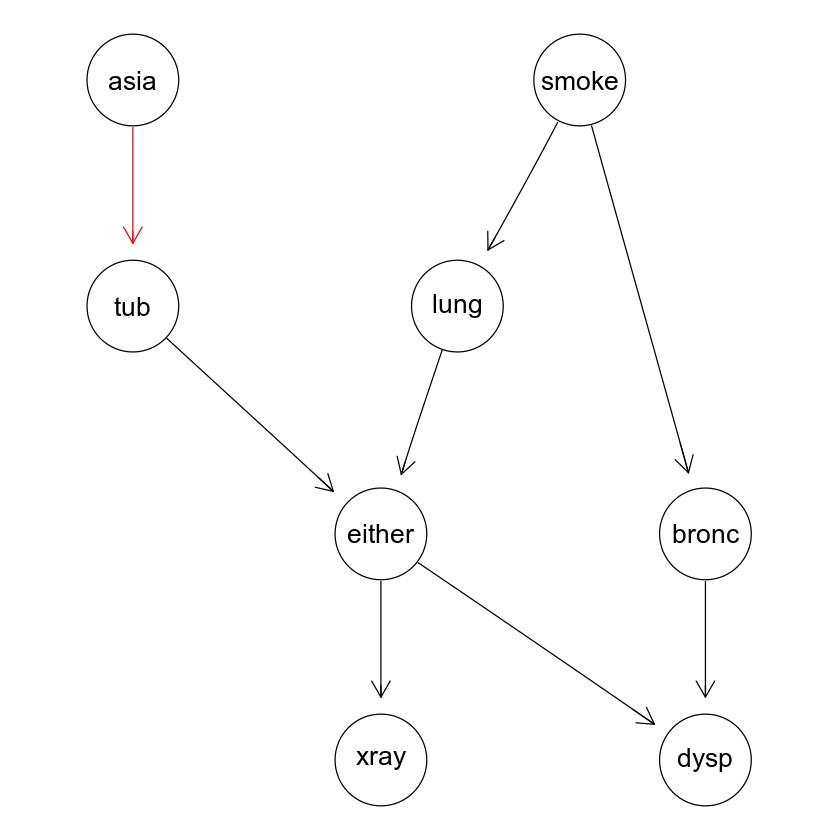

In [16]:
#Graphical comparison between the two networks. In red the arcs that
#are not present in k2 network
graphviz.compare(Asia_net$Network,True_asia_network)

We are missing only one dependence: from 'asia' to 'tub'

2.2.C [**CHILD**](#sec2.2.C)

In [17]:
#Structure of the true Child network
True_Child_network = model2network("[BirthAsphyxia][Disease|BirthAsphyxia][Age|Disease:Sick][LVH|Disease][DuctFlow|Disease][CardiacMixing|Disease][LungParench|Disease][LungFlow|Disease][Sick|Disease][HypDistrib|DuctFlow:CardiacMixing][HypoxiaInO2|CardiacMixing:LungParench][CO2|LungParench][ChestXray|LungParench:LungFlow][Grunting|LungParench:Sick][LVHreport|LVH][LowerBodyO2|HypDistrib:HypoxiaInO2][RUQO2|HypoxiaInO2][CO2Report|CO2][XrayReport|ChestXray][GruntingReport|Grunting]")

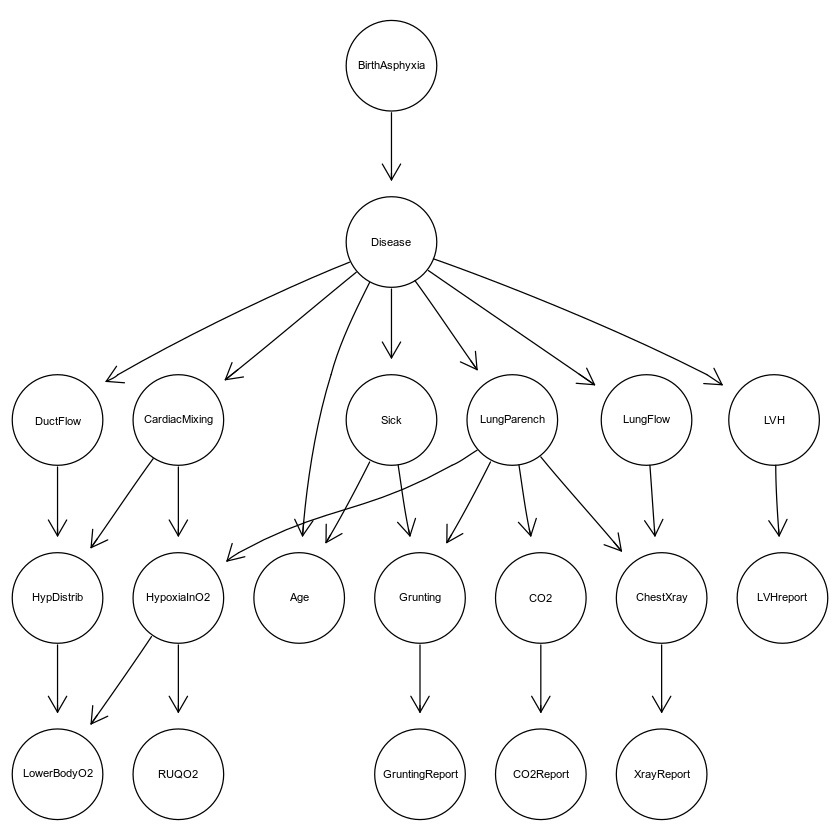

In [18]:
#Grah of the true Child network
graphviz.plot(True_Child_network)

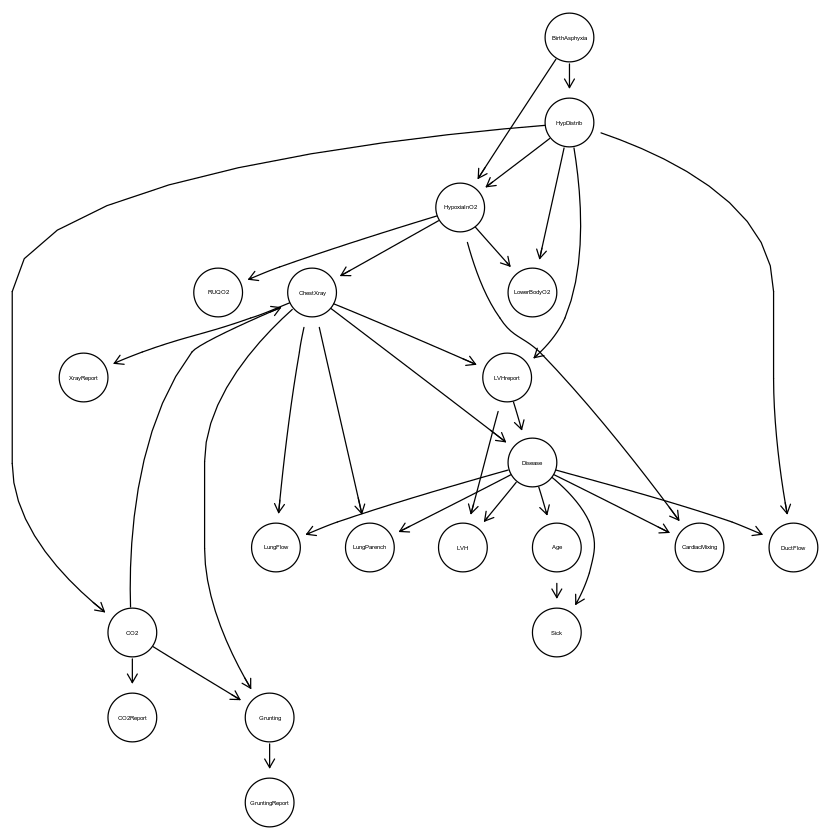

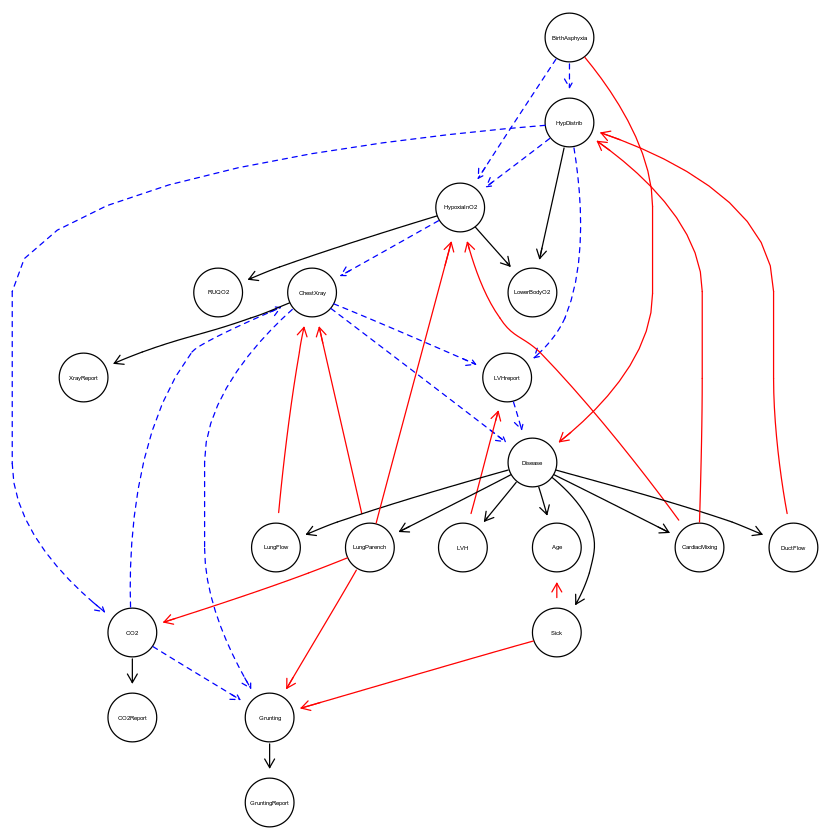

In [19]:
#Graphical comparison between K2 network and . In red the arcs that
#are not present in k2 network and in dashe blue the arcs that are
#not present in the true network
graphviz.compare(Child_net$Network,True_Child_network)

Our results may be influenced by the initial node selection.

We will address this issue using two approaches suggested in G. F. Cooper and E. Herskovits paper [[2]](#ref2):

• K2R Algorithm (K2 REVERSE): 

This algorithm is similar to K2 but starts with a fully connected belief-network structure based on a given node order. It then conducts a greedy search by removing arcs.


• Random Initial Ordering: 

We will generate multiple random node orders and apply the K2 algorithm to each order.
We will report the most probable belief-network structure obtained from K2 across these various orders.

# 2.3 [**K2 REVERSE or K2R**](#sec2.3)

In [20]:
library('igraph')

In [21]:
k2R_algorithm <- function(dataset, f) {
    
    # We start the timer
    Start <- Sys.time()
    
    nodes <- names(dataset)
    n     <- length(nodes)
    
    # Start with 2 empty networks
    network1 <- empty.graph(nodes)

    network2 <- empty.graph(nodes)
    
    # Add all possible arcs to make it fully connected 

    #In one order (network1)
    #And in the opposite order (network2)
    for (i in 1:n) {
        for (j in 1:n) {
            if (i != j) {
                network1 <- set.arc(network1, from = nodes[i], to = nodes[j])
                
                network2 <- set.arc(network2, from = nodes[j], to = nodes[i])
            }
        }
    }
    

    # We start from i=2 because the first node doesn't have previous nodes so
    # it doesn't have parents
    for (i in 2:n) {
        cat('giro', i, '\n')
        
        node    <- nodes[i]
        cat('nodo', node, '\n')
        
        Pred    <- nodes[1:(i-1)]
        
        cat('nodi precedenti: ', Pred, '\n')

        # Start with all possible parents
        parents <- Pred 
        cat('i parenti di ', node, ' sono ', parents, '\n')

        P_old   <- f(dataset, node, parents)
        cat('P_old = ', P_old, '\n')
        
        OKToProceed <- TRUE
        
        # Remove parents
        while (OKToProceed && length(parents) > 0) { 
            
            z <- parents[which.max(sapply(parents, function(J) f(dataset, node, setdiff(parents, J))))]
            cat('Best possible candidate to remove is ', z, '\n')

            # Compute the probability of the new network without the arc
            P_new <- f(dataset, node, setdiff(parents, z))
            cat('P_new = ', P_new, '\n')
            

            if (P_new > P_old) {
                
                parents <- setdiff(parents, z)
                cat('parents: ', parents, '\n')
                
                P_old <- P_new
                cat('Adesso P_old = P_new = ', P_old, '\n')
                
                network1 <- drop.arc(network1, from = z, to = node)
                network2 <- drop.arc(network2, from = node, to = z)

            } else {
                OKToProceed <- FALSE
            }
        }
    }
    
    Evaluation1 <- score(network1, dataset |> mutate_all(as_factor) |> as.data.frame())
    
    Evaluation2 <- score(network2, dataset |> mutate_all(as_factor) |> as.data.frame())
    
    # Stop the timer
    Stop <- Sys.time()
    
    Execution_time <- Stop - Start
    cat("Elapsed time:", Execution_time, "seconds\n")
    
    return(list('Network1' = network1,'Network2'=network2, 'Score1' = Evaluation1, 'Score2'=Evaluation2))
}


In [22]:
#Apply the algorithm to the Asia dataset
Asia_net_2.0<-k2R_algorithm(dataset=Asia,f=log.f)

giro 2 
nodo tub 
nodi precedenti:  asia 
i parenti di  tub  sono  asia 
P_old =  -575.264 
Best possible candidate to remove is  asia 
P_new =  -575.1688 
parents:   
Adesso P_old = P_new =  -575.1688 
giro 3 
nodo smoke 
nodi precedenti:  asia tub 
i parenti di  smoke  sono  asia tub 
P_old =  -6938.138 
Best possible candidate to remove is  tub 
P_new =  -6937.323 
parents:  asia 
Adesso P_old = P_new =  -6937.323 
Best possible candidate to remove is  asia 
P_new =  -6935.428 
parents:   
Adesso P_old = P_new =  -6935.428 
giro 4 
nodo lung 
nodi precedenti:  asia tub smoke 
i parenti di  lung  sono  asia tub smoke 
P_old =  -1902.17 
Best possible candidate to remove is  tub 
P_new =  -1895.197 
parents:  asia smoke 
Adesso P_old = P_new =  -1895.197 
Best possible candidate to remove is  asia 
P_new =  -1889.711 
parents:  smoke 
Adesso P_old = P_new =  -1889.711 
Best possible candidate to remove is  smoke 
P_new =  -2094.995 
giro 5 
nodo bronc 
nodi precedenti:  asia tub smoke

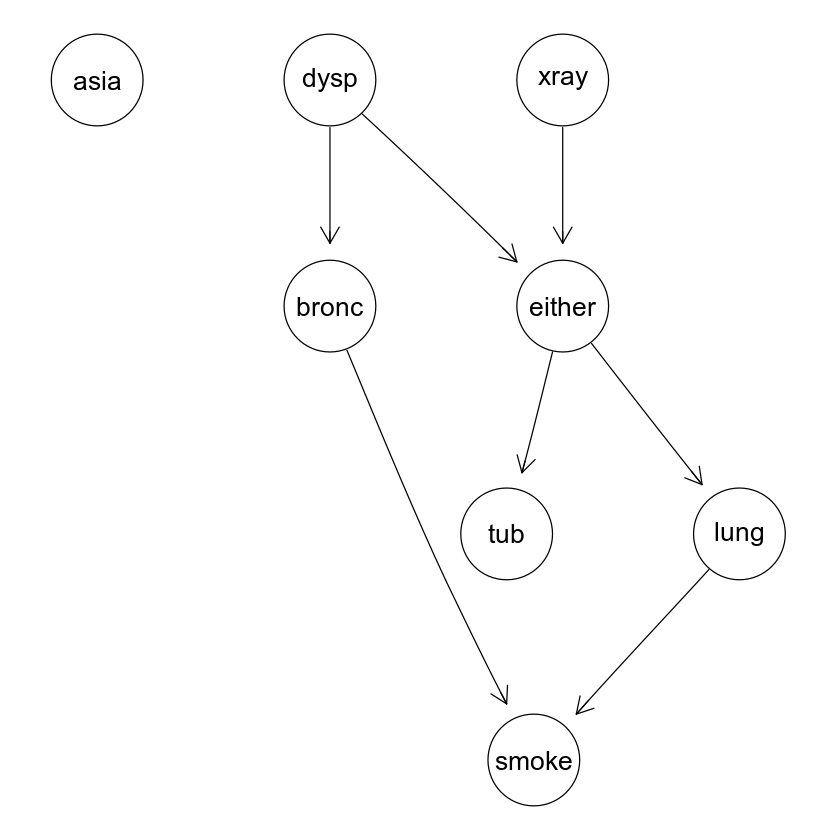

In [23]:
#Graph of the first network,obtaiend with the first order
graphviz.plot(Asia_net_2.0$Network1)

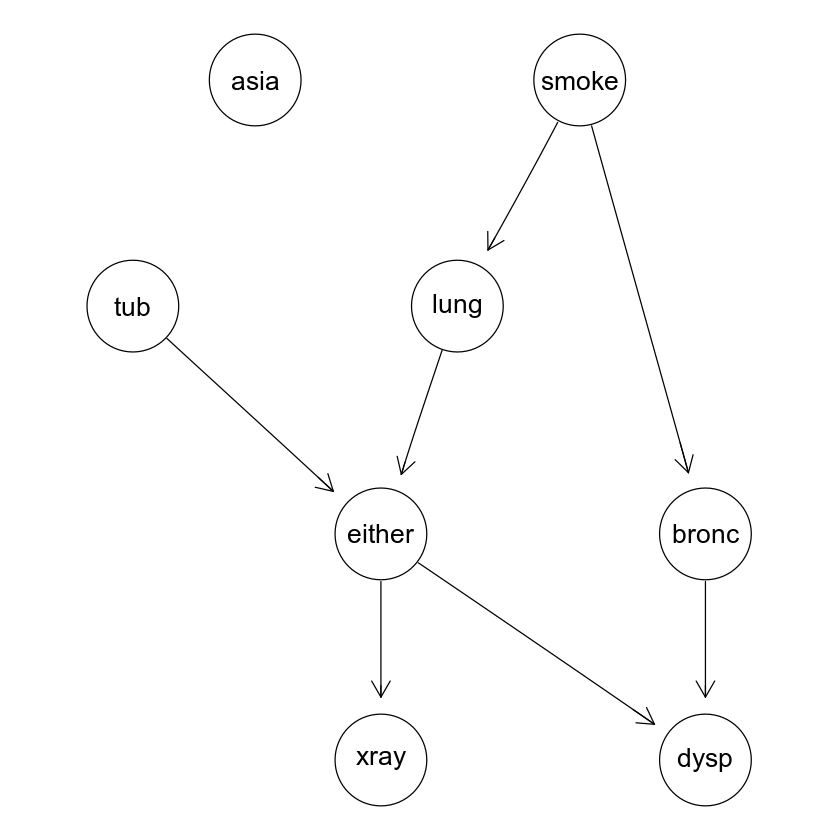

In [24]:
#Graph of the second network,obtained with the second order
graphviz.plot(Asia_net_2.0$Network2)

In [25]:
#Apply the algorithm to the Child dataset
Child_net_2.0<-k2R_algorithm(dataset=Child,f=log.f) 

giro 2 
nodo HypDistrib 
nodi precedenti:  BirthAsphyxia 
i parenti di  HypDistrib  sono  BirthAsphyxia 
P_old =  -3195.052 
Best possible candidate to remove is  BirthAsphyxia 
P_new =  -3209.341 
giro 3 
nodo HypoxiaInO2 
nodi precedenti:  BirthAsphyxia HypDistrib 
i parenti di  HypoxiaInO2  sono  BirthAsphyxia HypDistrib 
P_old =  -9411.368 
Best possible candidate to remove is  BirthAsphyxia 
P_new =  -9415.965 
giro 4 
nodo CO2 
nodi precedenti:  BirthAsphyxia HypDistrib HypoxiaInO2 
i parenti di  CO2  sono  BirthAsphyxia HypDistrib HypoxiaInO2 
P_old =  -7727.391 
Best possible candidate to remove is  HypoxiaInO2 
P_new =  -7700.16 
parents:  BirthAsphyxia HypDistrib 
Adesso P_old = P_new =  -7700.16 
Best possible candidate to remove is  BirthAsphyxia 
P_new =  -7692.229 
parents:  HypDistrib 
Adesso P_old = P_new =  -7692.229 
Best possible candidate to remove is  HypDistrib 
P_new =  -7695.154 
giro 5 
nodo ChestXray 
nodi precedenti:  BirthAsphyxia HypDistrib HypoxiaInO2 CO2 

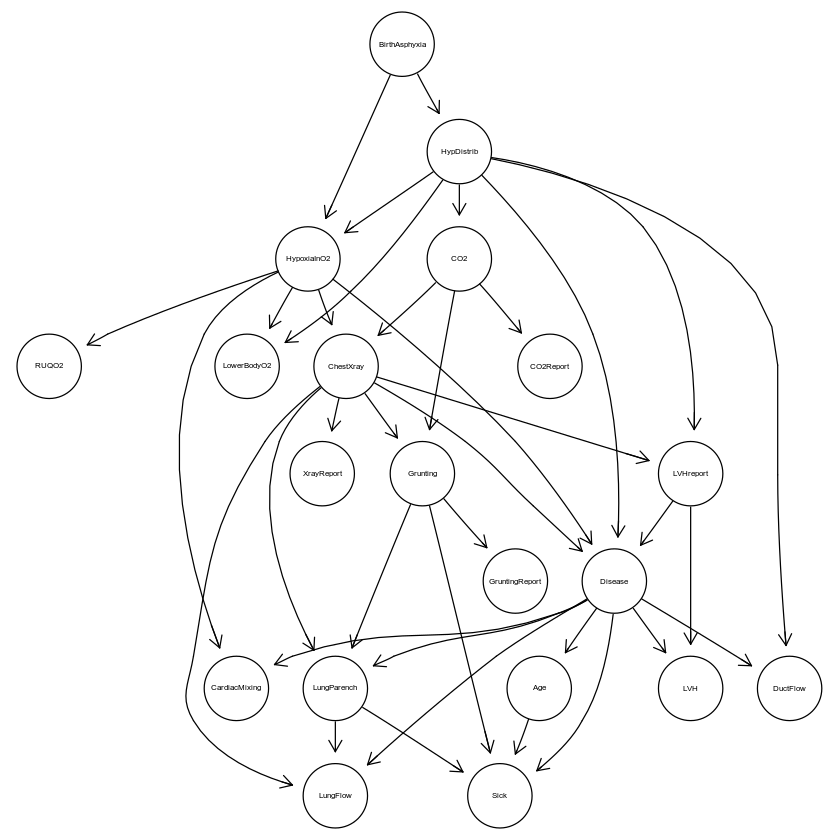

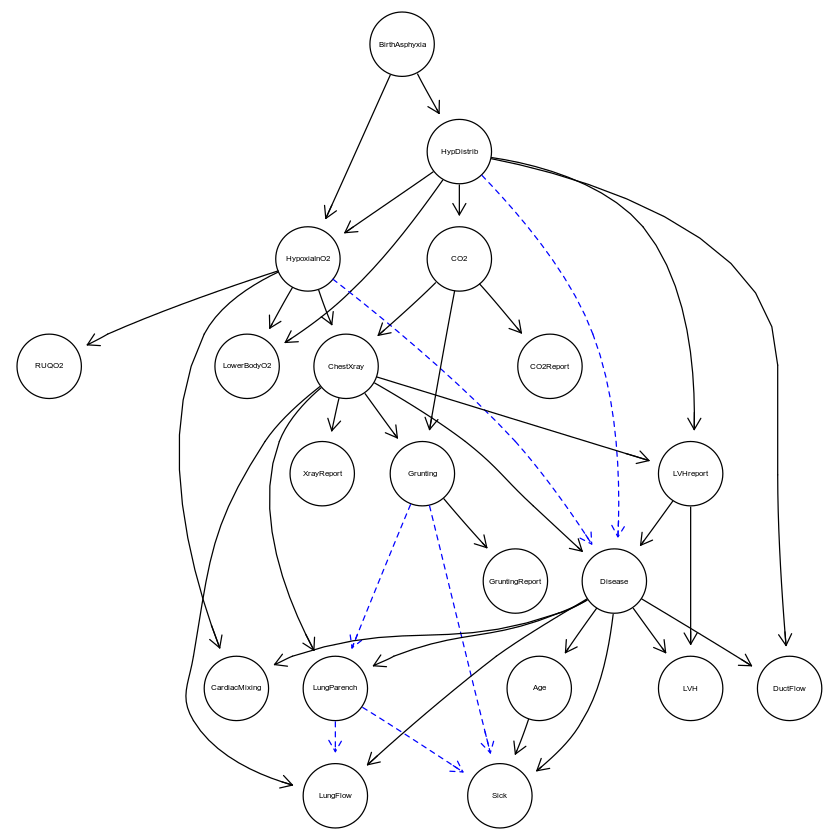

In [26]:
#Comparison between new tewtwork and the old one
#In dashed blue the arcs that are not present in the old network
graphviz.compare(Child_net_2.0$Network2,Child_net$Network)

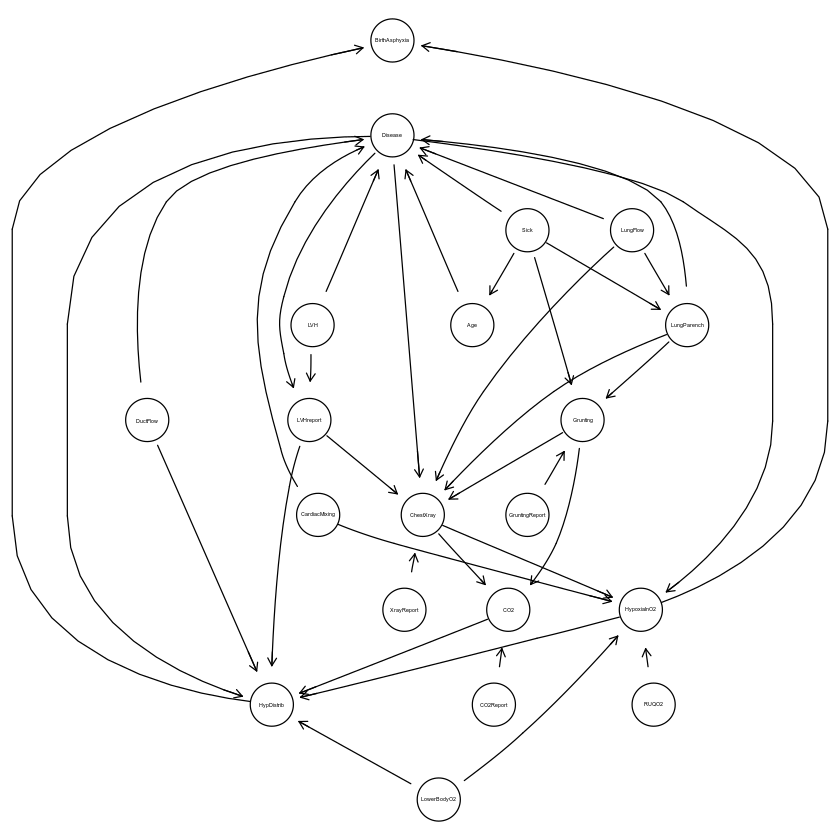

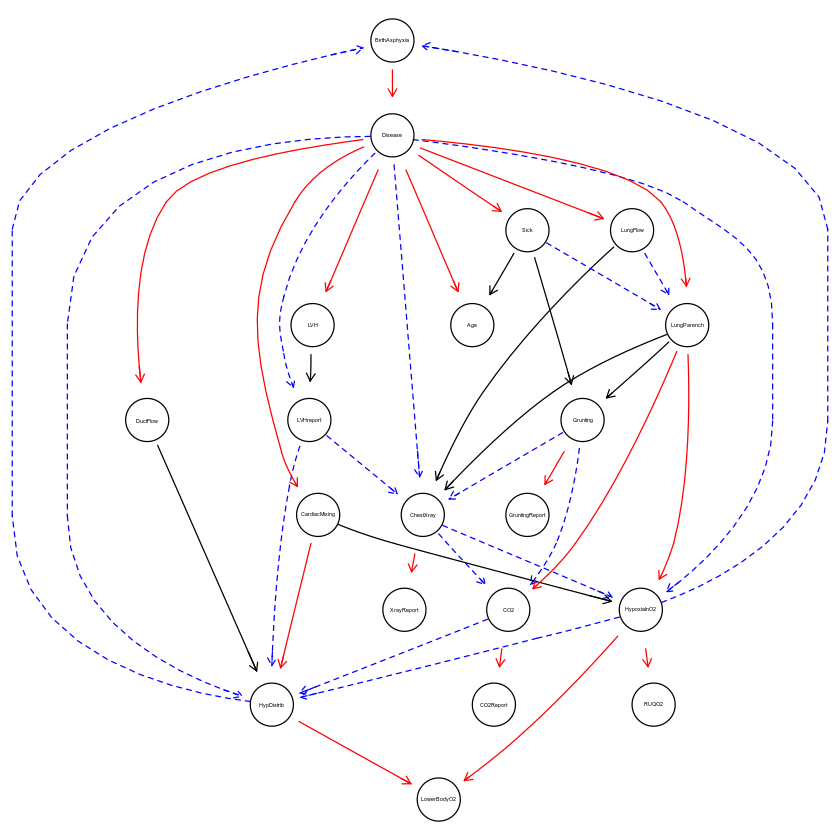

In [27]:
#Comparison between new network, first order, and the true one
graphviz.compare(Child_net_2.0$Network1,True_Child_network)

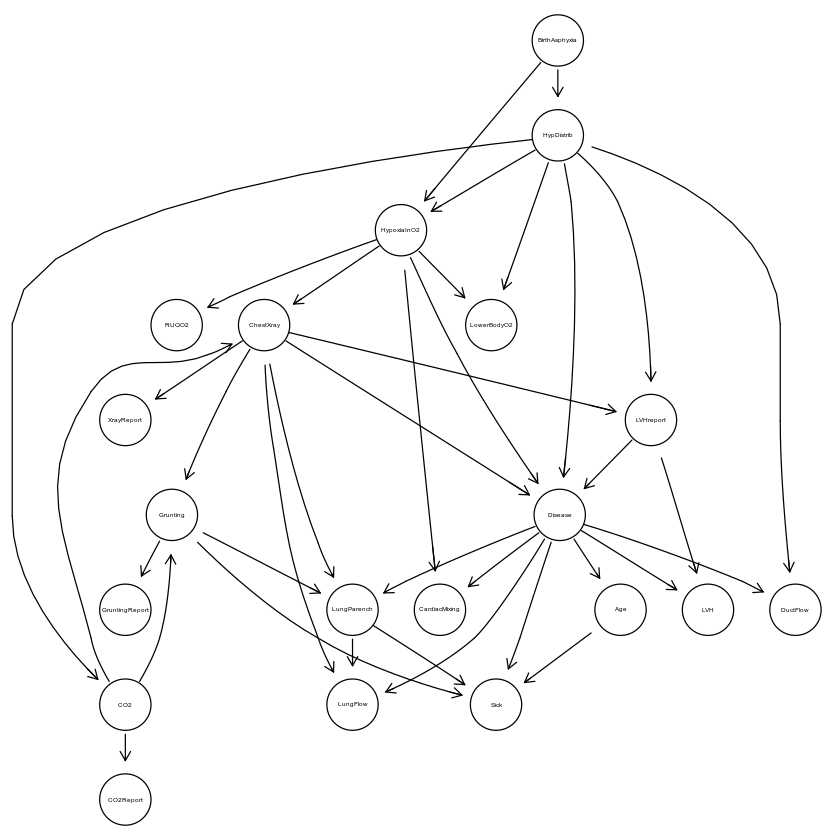

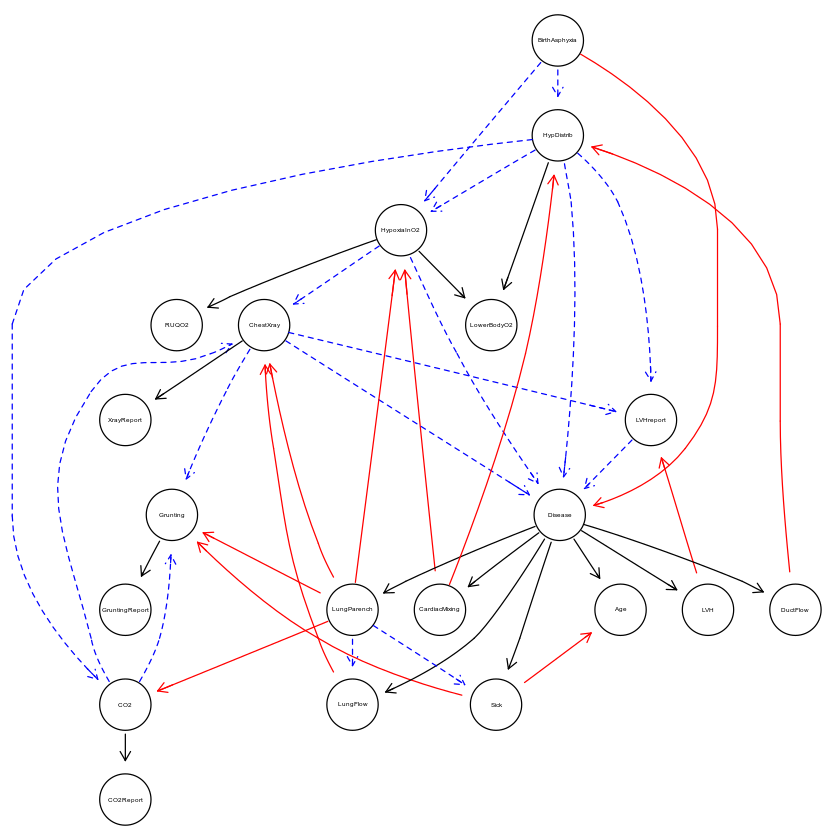

In [28]:
#Comparison between new network, second order, and the true one
graphviz.compare(Child_net_2.0$Network2,True_Child_network)

# 2.4 [**RANDOM INITIAL ORDERING**](#sec2.4)

I modify the previous K2 algorithm function in order that gets in input the nodes and it
doesn't define them inside the function.

This is useful to define the nodes in a random order.

In [29]:
#Same function as before, but with the possibility to give in input the nodes
k2<-function(upper.limit.parents,dataset,f,nodes){
    
    # We start the timer
    Start   <- Sys.time()

    n       <- length(nodes)
    
    network <- empty.graph(nodes=nodes)
    
   
    # We start from i=2 because the first node doesn't have previous nodes so
    # it doesn't have parents
    for(i in 2:n){
        cat('giro',i,'\n')
        
        node  <- nodes[i]
        cat('nodo',node,'\n')
        
        Pred   <- nodes[1:(i-1)]
        
        cat('nodi precedenti: ',Pred,'\n')
        
        parents <- c()
 
        cat('i parenti di ',node,' sono ', parents,'\n')
        
        P_old <- f(dataset,node,parents)
        
        cat('P_old = ',P_old,'\n')
        
        OKToProceed <- TRUE

        while( OKToProceed & length(parents) < upper.limit.parents ){
            
            #P_new <- P_old
            possible.parents <- setdiff(Pred,parents)
            
            z<-possible.parents[which.max(sapply(possible.parents, function(J) f(dataset, node, c(parents, J))))]
            cat('best posssible candidate is ',z,'\n')        
            
            P_new<-f(dataset,node,c(parents,z))
            cat('P_new = ',P_new,'\n')

            if (P_new > P_old) {
                
                parents <- c(parents, z)
                cat('parents: ',parents,'\n')
                
                P_old <- P_new
                cat('Adesso P_old = P_new = ',P_old,'\n')

                network <- set.arc(network, from=z, to=node)
            } else {
                
                OKToProceed <- FALSE
                
            }
        }
    }
    
    Evaluation <- score(network, dataset |> mutate_all(as_factor) |> as.data.frame())
    
    # Stop the timer
    Stop <- Sys.time()

    Execution_time <- Stop - Start

    cat("K2_time:", Execution_time, "seconds\n")

    return(list('Network'=network,'Evaluation'=Evaluation))
}

In [30]:
# New Random K2 algorithm
K2_RANDOMIZE<-function(upper.limit.parents, dataset, f, num_iterations,seed) {
    set.seed(seed)
    
    # We start the timer
    Start <- Sys.time()

    # Initialize the best network and BIC score
    best_network <- NULL
    best_score   <- -Inf
    
    nodes <- names(dataset)
    
    for (iteration in 1:num_iterations) {

        # Randomly shuffle the order of nodes
        shuffled_nodes <- sample(nodes)
        
        # Perform K2 algorithm with shuffled node order
        result         <- k2(upper.limit.parents, dataset, f, shuffled_nodes)
        
        # Check if the current network has a better score
        if (result$Evaluation > best_score) {
            best_network <- result$Network
            best_score   <- result$Evaluation
        }
    }
    Stop <- Sys.time()

    Execution_time <- Stop - Start

    cat("K2_RANDOM_time:", Execution_time, "seconds\n")

    return(list('BestNetwork' = best_network, 'BestScore' = best_score))
}

In [31]:
#Apply the algorithm to the Child dataset
Child_net_3.0<-K2_RANDOMIZE(upper.limit.parents=2,dataset=Child,f=log.f,num_iterations=5,seed=123)

giro 2 
nodo LungFlow 
nodi precedenti:  LVH 
i parenti di  LungFlow  sono  
P_old =  -10397.46 
best posssible candidate is  LVH 
P_new =  -9992.43 
parents:  LVH 
Adesso P_old = P_new =  -9992.43 
best posssible candidate is   
P_new =  -9992.43 
giro 3 
nodo Age 
nodi precedenti:  LVH LungFlow 
i parenti di  Age  sono  
P_old =  -8852.221 
best posssible candidate is  LungFlow 
P_new =  -8721.165 
parents:  LungFlow 
Adesso P_old = P_new =  -8721.165 
best posssible candidate is  LVH 
P_new =  -8471.931 
parents:  LungFlow LVH 
Adesso P_old = P_new =  -8471.931 
giro 4 
nodo HypoxiaInO2 
nodi precedenti:  LVH LungFlow Age 
i parenti di  HypoxiaInO2  sono  
P_old =  -9492.672 
best posssible candidate is  LungFlow 
P_new =  -9022.113 
parents:  LungFlow 
Adesso P_old = P_new =  -9022.113 
best posssible candidate is  LVH 
P_new =  -9026.863 
giro 5 
nodo CO2Report 
nodi precedenti:  LVH LungFlow Age HypoxiaInO2 
i parenti di  CO2Report  sono  
P_old =  -5661.672 
best posssible candi

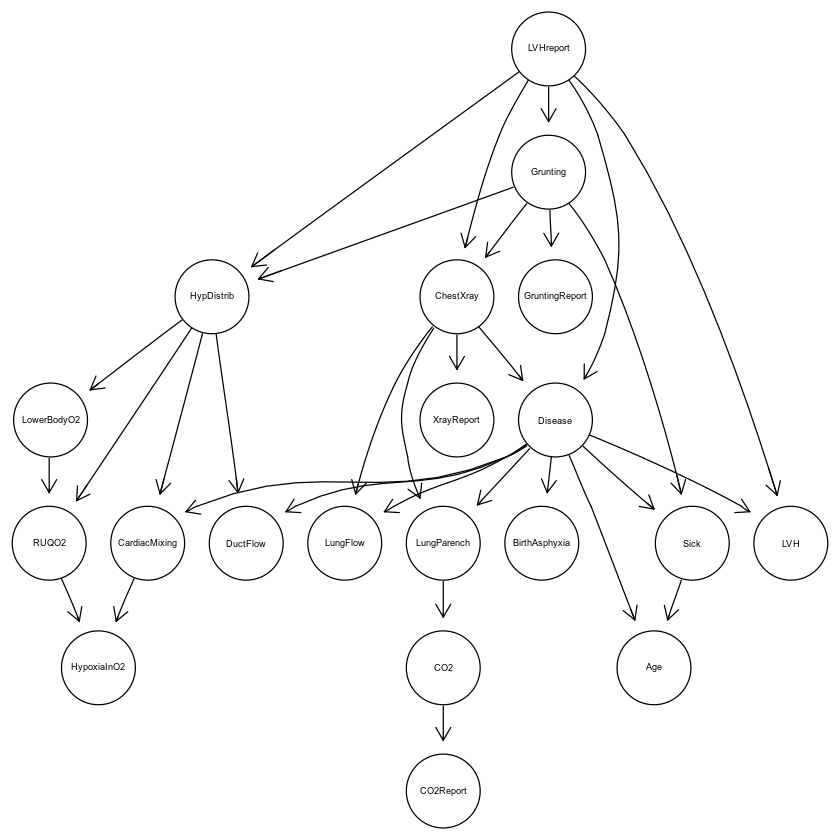

In [32]:
#Graph of the network
graphviz.plot(Child_net_3.0$BestNetwork)

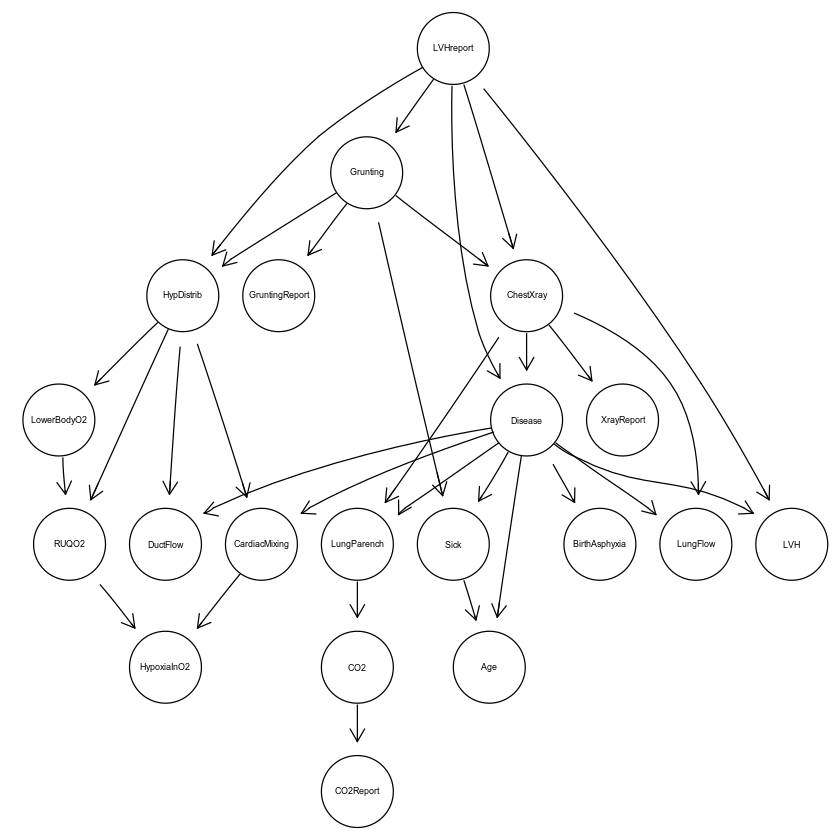

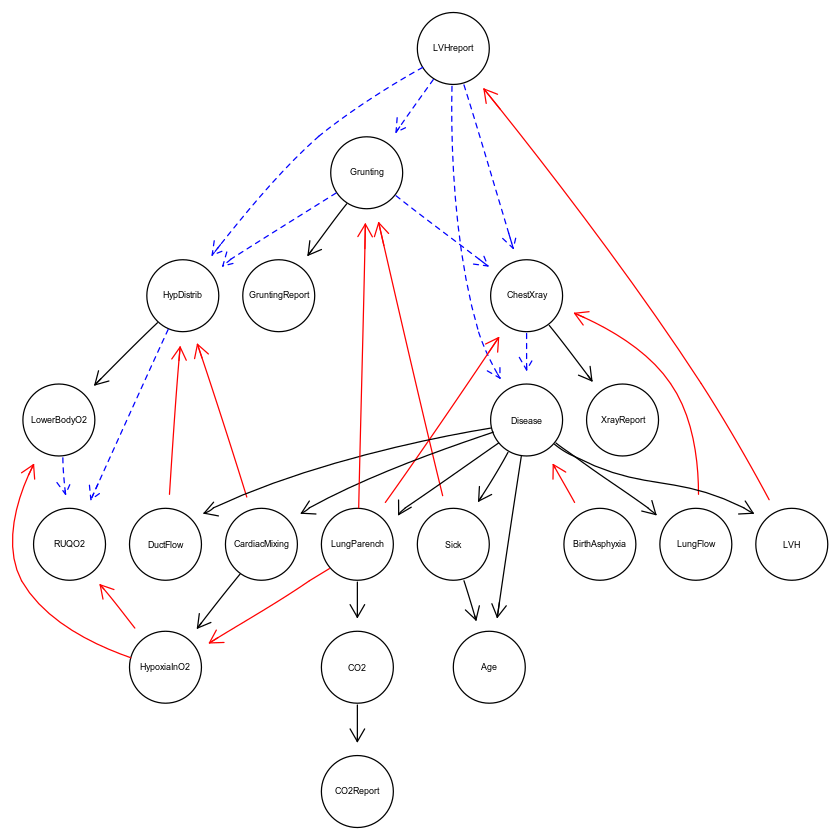

In [33]:
#Comparison between new network and true one
graphviz.compare(Child_net_3.0$BestNetwork,True_Child_network)

# [**PART 3**](#sec3)

# 3.1 [**BNSTRUCT**](#sec3.1)

Bayesian Network Structure Learning from Data with Missing Values.\
The package implements the Silander-Myllymaki complete search, the Max-Min Parents-and-Children, the Hill-Climbing, the Max-Min Hill-climbing heuristic searches, and the Structural Expectation-Maximization algorithm.\
Available scoring functions are BDeu, AIC, BIC.\
The package also implements methods for generating and using bootstrap samples, imputed data, inference.

# 3.1.A [**TEST on ASIA Dataset**](#sec3.1.A)

In [34]:
#Create Bayesian network object from the dataset
bn.asia<-BN(asia())

In [35]:
#Learn the structure of the network with the MMHC algorithm
bn.asia_net<-learn.network(asia(),algo='mmhc')

bnstruct :: learning the structure using MMHC ...

bnstruct :: learning using MMHC completed.

bnstruct :: learning network parameters ... 

bnstruct :: parameter learning done.



In [36]:
bn.asia_net


Bayesian Network: BNDataset

num.nodes 8

variables
Asia Tubercolosys Smoke LungCancer Bronchitis Either X-ray Dyspnea
discreteness
TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
node.sizes
2 2 2 2 2 2 2 2
Adjacency matrix:
             Asia Tubercolosys Smoke LungCancer Bronchitis Either X-ray Dyspnea
Asia            0            1     1          0          0      0     0       0
Tubercolosys    0            0     0          0          0      1     0       0
Smoke           0            0     0          0          0      0     0       1
LungCancer      0            0     0          0          1      0     0       0
Bronchitis      0            0     0          0          0      1     0       0
Either          0            0     0          0          0      0     0       0
X-ray           0            0     0          0          0      0     0       1
Dyspnea         0            0     0          0          0      0     0       0

Conditional probability tables:$Asia
Asia
        1         2

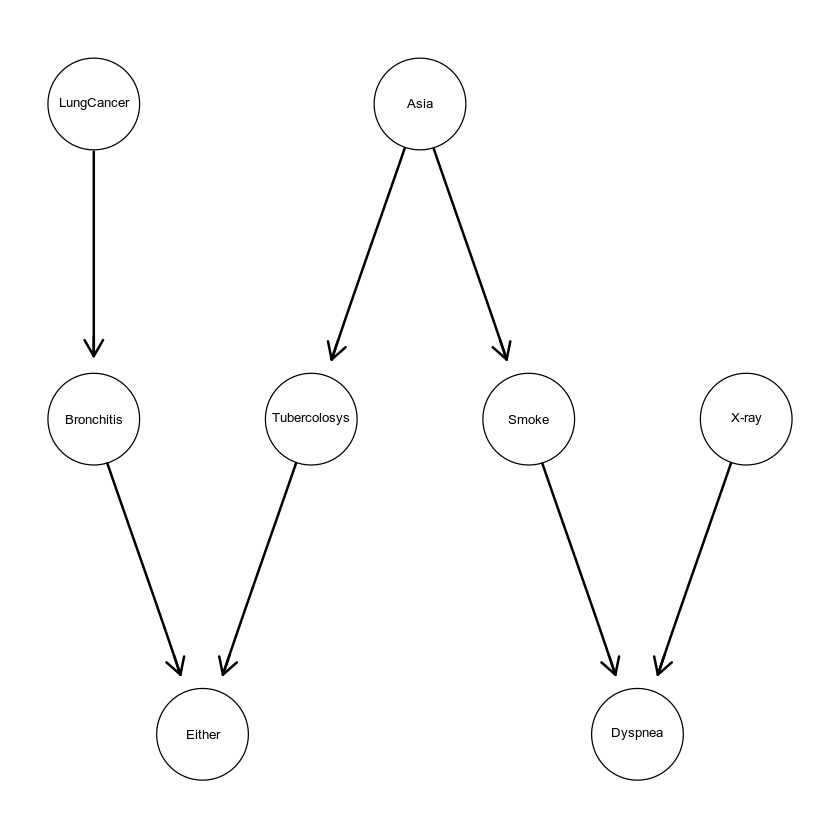

In [37]:
#Plot the network
plot(bn.asia_net)

# 3.1.B [**TEST on CHILD Dataset**](#sec3.1.B)

In [38]:
#Create Bayesian network object from the dataset
bn.child<-BN(child())

In [39]:
#Learn the structure of the network with the MMHC algorithm
bn.child_net<-learn.network(child(),algo='mmhc')

bnstruct :: learning the structure using MMHC ...



bnstruct :: learning using MMHC completed.

bnstruct :: learning network parameters ... 

bnstruct :: parameter learning done.



In [40]:
bn.child_net


Bayesian Network: BNDataset

num.nodes 20

variables
BirthAsphyxia Disease Age LVH DuctFlow CardiacMixing LungParench LungFlow Sick HypDistrib HypoxiaInO2 CO2 ChestXray Grunting LVHReport LowerBodyO2 RUQO2 CO2Report XrayReport GruntingReport
discreteness
TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
node.sizes
2 6 3 2 3 4 3 3 2 2 3 3 5 2 2 3 3 2 5 2
Adjacency matrix:
               BirthAsphyxia Disease Age LVH DuctFlow CardiacMixing LungParench
BirthAsphyxia              0       1   0   0        0             0           0
Disease                    0       0   1   0        1             1           1
Age                        0       0   0   0        0             0           0
LVH                        0       1   0   0        0             0           0
DuctFlow                   0       0   0   0        0             0           0
CardiacMixing              0       0   0   0        0             0           1
LungParench    

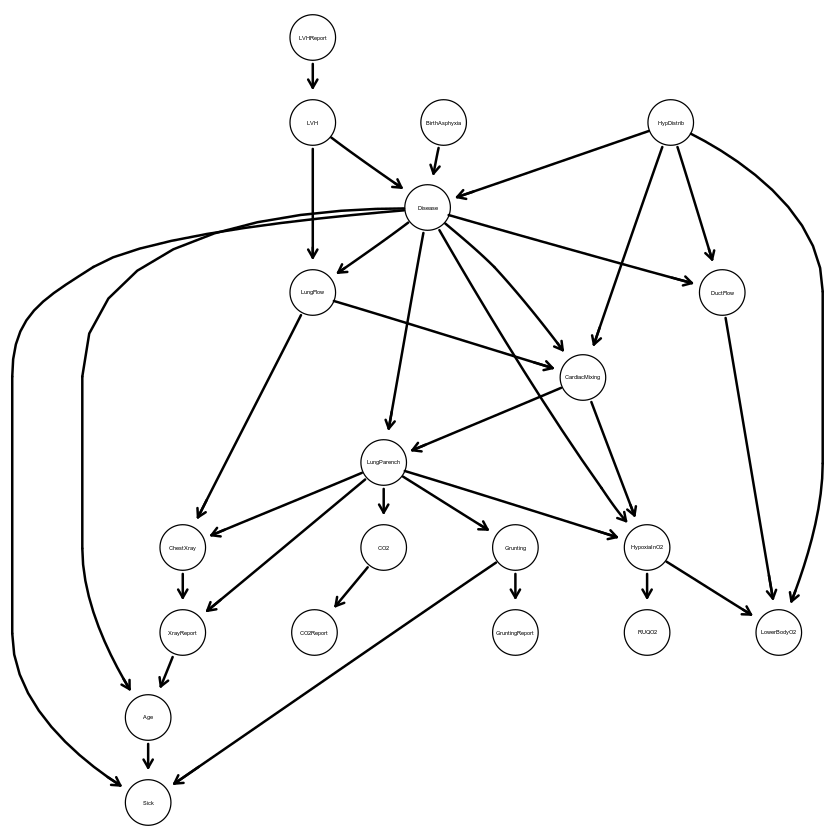

In [41]:
#Plot the network
plot(bn.child_net)

# 3.2 [**FINAL COMPARISONS**](#sec3.2)

To assess the comparability of results generated by various algorithms, we calculate the Structural Hamming Distance (SHD) between the adjacency matrices produced by these algorithms and the one representing the true network

In [42]:
asia_columns<-tolower(variables(bn.asia_net))
asia_columns<-gsub('lungcancer','lung',asia_columns)
asia_columns<-gsub('tubercolosys','tub',asia_columns)
asia_columns<-gsub('bronchitis','bronc',asia_columns)
asia_columns<-gsub('dyspnea','dysp',asia_columns)
asia_columns<-gsub('x-ray','xray',asia_columns)

In [196]:
#Asia dataset table: we keep track of the SHD for each iteration of all the algorithms
Comparison_Asia <- data.frame(matrix(ncol = 6, nrow = 0))
colnames(Comparison_Asia) <- c("#Samples","SHD_K2","SHD_K2_RANDOM","SHD_K2R_1","SHD_K2R_2","SHD_mmhc")
    for (i in 1:100) {

        result_K2_random   <-  K2_RANDOMIZE(2,head(Asia,100*i),log.f, num_iterations=5,seed=123)
        result_K2_standard <-  k2_algorithm(2, head(Asia,100*i), log.f)  
        result_K2R         <-  k2R_algorithm(head(Asia,100*i), log.f)

        K2_standard_matrix   <-     amat(result_K2_standard$Network)
        K2_standard_matrix   <-     K2_standard_matrix[asia_columns,asia_columns]
           
        K2R_matrix_1         <-     amat(result_K2R$Network1)
        K2R_matrix_1         <-     K2R_matrix_1[asia_columns,asia_columns]
        
        K2R_matrix_2         <-     amat(result_K2R$Network2)
        K2R_matrix_2         <-     K2R_matrix_2[asia_columns,asia_columns]

        True_asia__matrix    <-     amat(True_asia_network)
        True_asia__matrix    <-     True_asia__matrix[asia_columns,asia_columns]


        K2_random_matrix     <-     amat(result_K2_random$BestNetwork)
        K2_random_matrix     <-     K2_random_matrix[asia_columns,asia_columns]

        SHD_K2_random   <- shd(True_asia__matrix,K2_random_matrix)
        SHD_K2_standard <- shd(True_asia__matrix,K2_standard_matrix)
        SHD_K2R_1   <- shd(True_asia__matrix,K2R_matrix_1)
        SHD_K2R_2   <- shd(True_asia__matrix,K2R_matrix_2)
        SHD_mmhc    <- shd(True_asia__matrix,dag(bn.asia_net))
        
        
             
        Comparison_Asia[nrow(Comparison_Asia) + 1,] = c(100*i,SHD_K2_standard,SHD_K2_random,SHD_K2R_1,SHD_K2R_2,SHD_mmhc)
    }

giro 2 
nodo dysp 
nodi precedenti:  xray 
i parenti di  dysp  sono  
P_old =  -70.42557 
best posssible candidate is  xray 
P_new =  -71.08166 
giro 3 
nodo smoke 
nodi precedenti:  xray dysp 
i parenti di  smoke  sono  
P_old =  -71.22065 
best posssible candidate is  dysp 
P_new =  -68.37566 
parents:  dysp 
Adesso P_old = P_new =  -68.37566 
best posssible candidate is  xray 
P_new =  -69.24695 
giro 4 
nodo either 
nodi precedenti:  xray dysp smoke 
i parenti di  either  sono  
P_old =  -19.79704 
best posssible candidate is  xray 
P_new =  -12.78381 
parents:  xray 
Adesso P_old = P_new =  -12.78381 
best posssible candidate is  dysp 
P_new =  -14.0536 
giro 5 
nodo tub 
nodi precedenti:  xray dysp smoke either 
i parenti di  tub  sono  
P_old =  -9.220291 
best posssible candidate is  either 
P_new =  -7.570443 
parents:  either 
Adesso P_old = P_new =  -7.570443 
best posssible candidate is  xray 
P_new =  -9.574983 
giro 6 
nodo lung 
nodi precedenti:  xray dysp smoke either t

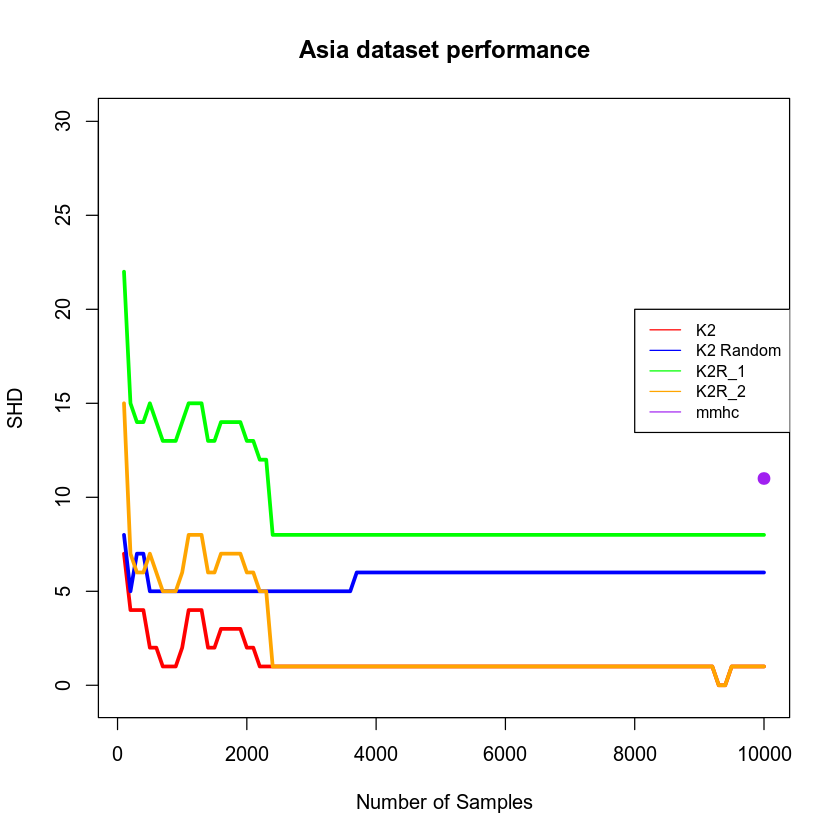

In [197]:
#Plots
plot(Comparison_Asia$"#Samples",Comparison_Asia$SHD_K2,type="l",ylab="SHD",xlab = "Number of Samples",ylim = c(-0.5,30),main="Asia dataset performance",col = "red",lty=1, lwd = 3)
lines(Comparison_Asia$"#Samples",Comparison_Asia$SHD_K2_RANDOM,col = "blue",lty=1, lwd = 3)
lines(Comparison_Asia$"#Samples",Comparison_Asia$SHD_K2R_1,col = "green",lty=1, lwd = 3)
lines(Comparison_Asia$"#Samples",Comparison_Asia$SHD_K2R_2,col = "orange",lty=1, lwd = 3)
points(10000,Comparison_Asia$SHD_mmhc[1],col = "purple",lty=1,pch=19, lwd = 3)
legend(8000, 20, legend=c("K2", "K2 Random", "K2R_1","K2R_2","mmhc"),col=c("red", "blue", "green","orange","purple"), lty=1:1, cex=0.8)

In [59]:
child_columns<-variables(bn.child_net)
child_columns<-gsub('LVHReport','LVHreport',child_columns)

In [60]:
#Child dataset table: we keep track of the SHD for each iteration of all the algorithms
Comparison_Child <- data.frame(matrix(ncol = 6, nrow = 0))
colnames(Comparison_Child) <- c("#Samples","SHD_K2","SHD_K2_RANDOM","SHD_K2R_1","SHD_K2R_2","SHD_mmhc")
    for (i in 1:100) {

        result_K2_random   <-  K2_RANDOMIZE(2,head(Child,100*i),log.f, num_iterations=5,seed=123)
        result_K2_standard <-  k2_algorithm(2, head(Child,100*i), log.f)  
        result_K2R         <-  k2R_algorithm(head(Child,100*i), log.f)
       
        K2_standard_matrix   <-     amat(result_K2_standard$Network)
        K2_standard_matrix   <-     K2_standard_matrix[child_columns,child_columns]
        
        K2R_matrix_1         <-     amat(result_K2R$Network1)
        K2R_matrix_1         <-     K2R_matrix_1[child_columns,child_columns]
        
        K2R_matrix_2         <-     amat(result_K2R$Network2)
        K2R_matrix_2         <-     K2R_matrix_2[child_columns,child_columns]

        True_Child_matrix    <-     amat(True_Child_network)
        True_Child_matrix    <-     True_Child_matrix[child_columns,child_columns]

        K2_random_matrix     <-     amat(result_K2_random$BestNetwork)
        K2_random_matrix     <-     K2_random_matrix[child_columns,child_columns]

        SHD_K2_random   <- shd(True_Child_matrix,K2_random_matrix)
        SHD_K2_standard <- shd(True_Child_matrix,K2_standard_matrix)
        SHD_K2R_1   <- shd(True_Child_matrix,K2R_matrix_1)
        SHD_K2R_2   <- shd(True_Child_matrix,K2R_matrix_2)
        SHD_mmhc    <- shd(True_Child_matrix,dag(bn.child_net))
        
        
             
        Comparison_Child[nrow(Comparison_Child) + 1,] = c(100*i,SHD_K2_standard,SHD_K2_random,SHD_K2R_1,SHD_K2R_2,SHD_mmhc)
    }

giro 2 
nodo LungFlow 
nodi precedenti:  LVH 
i parenti di  LungFlow  sono  
P_old =  -102.5641 
best posssible candidate is  LVH 
P_new =  -103.6214 
giro 3 
nodo Age 
nodi precedenti:  LVH LungFlow 
i parenti di  Age  sono  
P_old =  -89.18203 
best posssible candidate is  LungFlow 
P_new =  -91.00677 
giro 4 
nodo HypoxiaInO2 
nodi precedenti:  LVH LungFlow Age 
i parenti di  HypoxiaInO2  sono  
P_old =  -102.2002 
best posssible candidate is  LungFlow 
P_new =  -101.9361 
parents:  LungFlow 
Adesso P_old = P_new =  -101.9361 
best posssible candidate is  LVH 
P_new =  -103.4701 
giro 5 
nodo CO2Report 
nodi precedenti:  LVH LungFlow Age HypoxiaInO2 
i parenti di  CO2Report  sono  
P_old =  -63.25722 
best posssible candidate is  LVH 
P_new =  -64.61588 
giro 6 
nodo HypDistrib 
nodi precedenti:  LVH LungFlow Age HypoxiaInO2 CO2Report 
i parenti di  HypDistrib  sono  
P_old =  -35.09744 
best posssible candidate is  LVH 
P_new =  -36.83322 
giro 7 
nodo Grunting 
nodi precedenti:  L

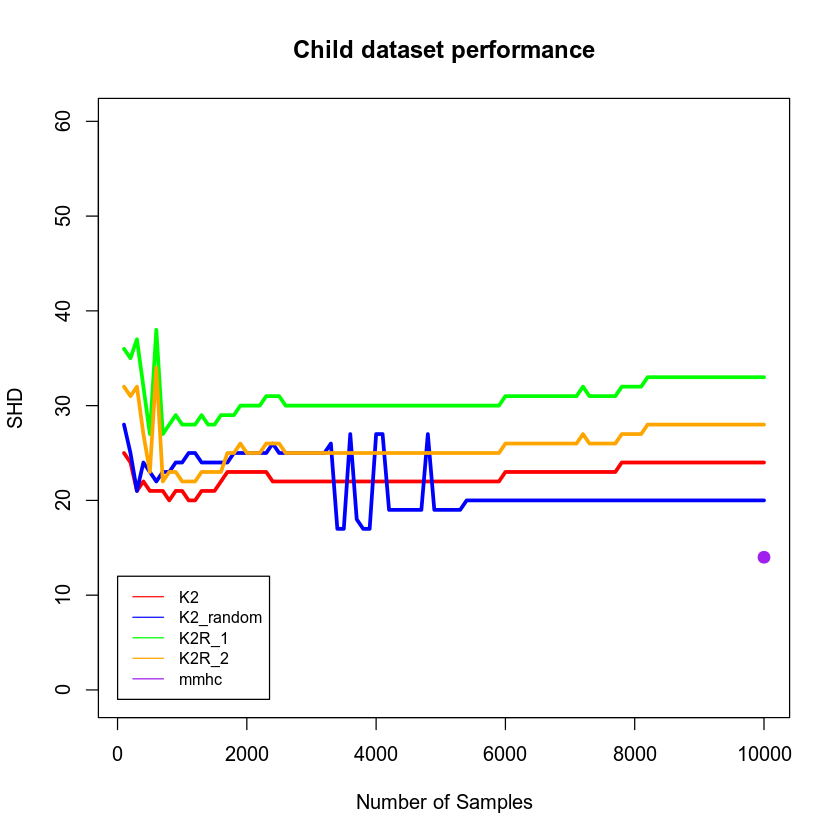

In [62]:
#Plots
plot(Comparison_Child$"#Samples",Comparison_Child$SHD_K2,type="l",ylab="SHD",xlab = "Number of Samples",ylim = c(-0.5,60),main="Child dataset performance",col = "red",lty=1, lwd = 3)
lines(Comparison_Child$"#Samples",Comparison_Child$SHD_K2_RANDOM,col = "blue",lty=1, lwd = 3)
lines(Comparison_Child$"#Samples",Comparison_Child$SHD_K2R_1,col = "green",lty=1, lwd = 3)
lines(Comparison_Child$"#Samples",Comparison_Child$SHD_K2R_2,col = "orange",lty=1, lwd = 3)
points(10000,Comparison_Child$SHD_mmhc[1],col = "purple",lty=1,pch=19, lwd = 3)
legend(1, 12, legend=c("K2", "K2_random", "K2R_1","K2R_2","mmhc"),col=c("red", "blue", "green","orange","purple"), lty=1:1, cex=0.8)

## **BIBLIOGRAPHY**

<a id='ref1'></a>
**[1]** M. Scutari and J. B. Denis, *Bayesian Networks*, CRC Press, 2022, Taylor and Francis Group

<a id='ref2'></a>
**[2]** G. F. Cooper and E. Herskovits, *A Bayesian Method for the Induction of Probabilistic Networks from Data*, Machine Learning 9, (1992) 309

<a id='ref3'></a>
**[3]** C. Ruiz, *Illustration of the K2 Algorithm for learning Bayes Net Structures*, http://web.cs.wpi.edu/~cs539/s11/Projects/k2_algorithm.pdf


<a id='ref4'></a>
**[4]** A. Franzin et al., *$\texttt{bnstruct}$: an R package for Bayesian Network structure learning in the presence of missing data*, Bioinformatics 33(8) (2017) 1250

<a id='ref5'></a>
**[5]** F. Sambo and A. Franzin, *$\texttt{bnstruct}$: an R package for Bayesian Network Structure Learning with missing data*, December 12, 2016

<a id='ref6'></a>
**[6]** https://www.bnlearn.com/bnrepository/discrete-small.html